In [10]:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import mmcv
import numpy as np
from PIL import ImageFont, ImageDraw, Image
import matplotlib.pyplot as plt
import pylab
import os
from pycocotools.coco import COCO
from imantics import Polygons, Mask
import cv2
pylab.rcParams['figure.figsize'] = (8.0, 10.0)

In [2]:
config_file = '../configs/cartons/mask_rcnn_r50_fpn_poly_1x_coco.py'
# download the checkpoint from model zoo and put it in `checkpoints/`
# url: https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_fpn_1x_coco/faster_rcnn_r50_fpn_1x_coco_20200130-047c8118.pth
checkpoint_file = '../work_dirs/mask_rcnn_r50_fpn_poly_1x_coco/latest.pth'

In [3]:
# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file, device='cuda:0')

load checkpoint from local path: ../work_dirs/mask_rcnn_r50_fpn_poly_1x_coco/latest.pth


In [4]:
# test a single image
img = '1 (147).jpg'
result = inference_detector(model, img)

/home/jovyan/local/1_user/jshwang@agilesoda.ai/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(


In [5]:
def draw_polygon(target_img, polygon):
    
    target_img = cv2.polylines(target_img, polygon, True, (255,0,0), 3)
    # Cv2랑 PIL 억지로 바꿔서 RGB, BGR 차이 있음

    target_img = Image.fromarray(target_img)
    draw = ImageDraw.Draw(target_img)
    #str(label+":"+key_value)
    return_img = np.array(target_img)
    
    return return_img

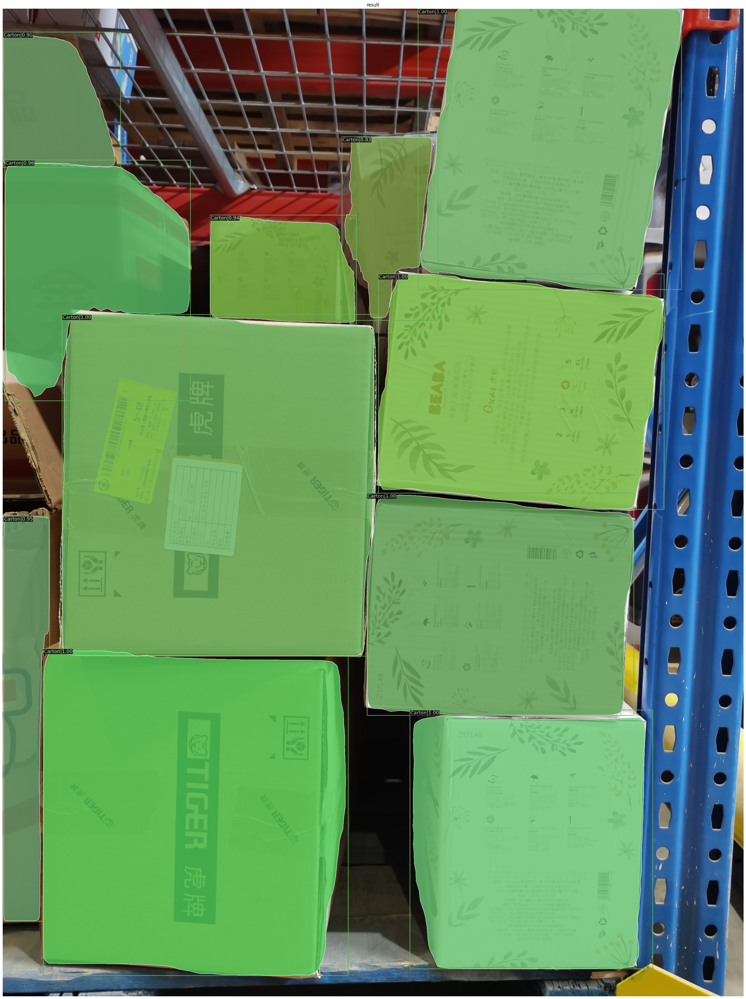

In [11]:
# show the results
show_result_pyplot(model, img, result, palette="random")

In [6]:
score_threshold = 0.3
result_0 = np.array(result[0])# (1, 33, 5) -> 맨 처음 1 (클래스 갯수가 1이라서) / 33개 탐지 / [xmin, ymin, xmax, ymax, class confidence score]
result_1 = np.array(result[1])# <class 'numpy.ndarray'> (1, 33, 375, 500) -> 맨 처음 1 (클래스 갯수가 1이라서) / 33개 탐지 / [True, False masking image]

detections = result_0[0][np.where(result_0[0][:, 4] > score_threshold)]
segmentations = result_1[0][np.where(result_0[0][:, 4] > score_threshold)]

# Threshold로 Filtering된 결과물만 받기
np_detec = np.array(detections) #result[0]
np_segm = np.array(segmentations) # result[1]


In [7]:
np_segm = np.where(np_segm == 1, 255, np_segm)
print(np_segm.shape)
masks = np.array(np_segm).astype(np.uint8)


(11, 3648, 2736)


In [8]:
# Segmentation mask
# masks = [np.where(m == 1, 255, m) for m in result[1]]
# print(masks[0].shape)
# print(masks[0])
# masks = np.array(masks[0])
# masks = masks.astype(np.uint8)

True

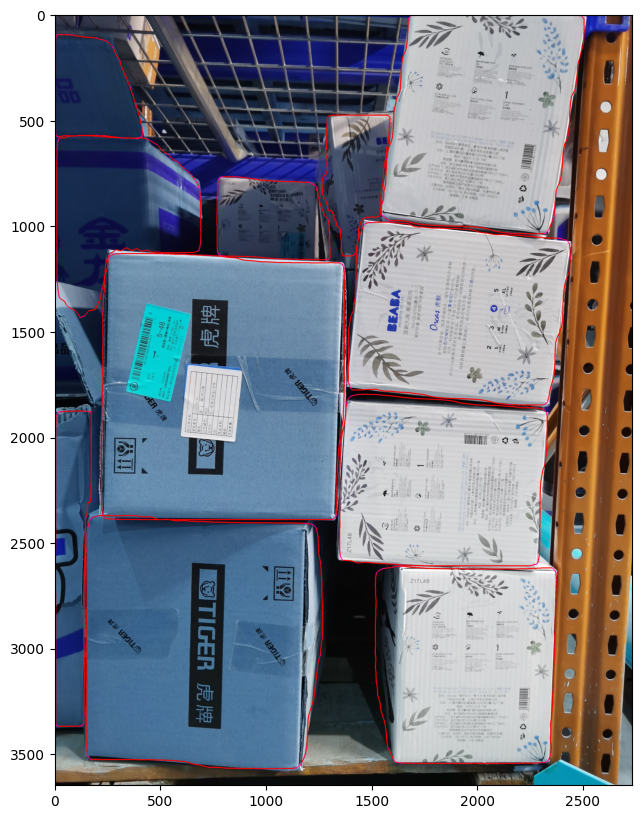

In [50]:
image = cv2.imread(img)
for i, mask in enumerate(masks):
    polygons = Mask(mask).polygons()
    smooth_point = cv2.convexHull(polygons.points[0])
    image = draw_polygon(image, polygons.points)
    #Points마다 점 찍고 싶을 때
    for point in smooth_point:
        for j in point:
            cv2.circle(image, tuple(j), 2, (255,0,255), -1) 

result_img = image
plt.imshow(result_img)
cv2.imwrite("./result.jpg", result_img)

In [36]:
polygons.points[1].shape

(473, 2)

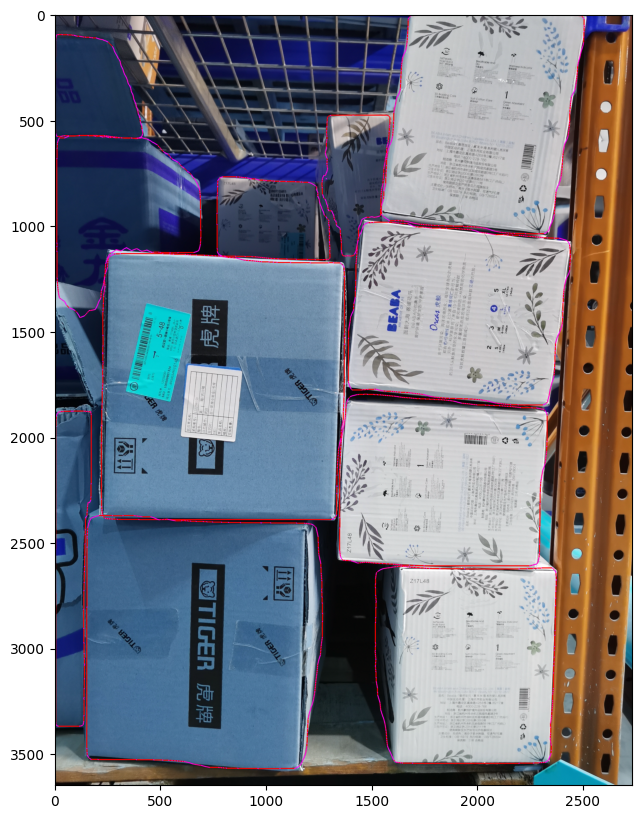

In [40]:
smooth = cv2.convexHull(polygons.points[1])
image = draw_polygon(image, smooth)
plt.imshow(image)


In [37]:
from scipy.interpolate import splprep, splev

contours = polygons.points

smoothened = []
for contour in contours:
    x,y = contour.T
    # Convert from numpy arrays to normal arrays
    x = x.tolist()[0]
    y = y.tolist()[0]
    # https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.interpolate.splprep.html
    tck, u = splprep([x,y], u=None, s=1.0, per=1)
    # https://docs.scipy.org/doc/numpy-1.10.1/reference/generated/numpy.linspace.html
    u_new = numpy.linspace(u.min(), u.max(), 25)
    # https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.interpolate.splev.html
    x_new, y_new = splev(u_new, tck, der=0)
    # Convert it back to numpy format for opencv to be able to display it
    res_array = [[[int(i[0]), int(i[1])]] for i in zip(x_new,y_new)]
    smoothened.append(numpy.asarray(res_array, dtype=numpy.int32))

# Overlay the smoothed contours on the original image
cv2.drawContours(original_img, smoothened, -1, (255,255,255), 2)

ModuleNotFoundError: No module named 'scipy'